## Problem Definition

### Objective
Build an image classifier to distinguish between different types of animals species from images.
This is a multi-class calssification problem with 15 different classes.

### Description of the classes
The Dataset consists of 15 different animal species classes:
1. Bear
2. Bird
3. Cat
4. Cow
5. Deer
6. Dog
7. Dolphin
8. Elephant
9. Giraffe
10. Horse
11. Kangaroo
12. Lion
13. Panda
14. Tiger
15. Zebra

### Use Case and Motiviation
1. Wildlife monitoring – identifying species from camera-trap images for ecological research.
2. Pet recognition – building tools for shelters, adoption platforms, or home automation.

The goal is to build an accurate model that can automatically classify animal species from images

### Expected Challenges
1. class variability - different images may include same species in different position, angles and distances.
2. background distractions - different images my be in different background like forest, snow, have different objects in the picture.
3. lighting and quality differences - images may be different in quality or lighting conditions.
4. small data for each class - with 100-150 examples per class, we may risk overfitting.

## Dataset Creation and Preperation
**Dataset**: Animal-Data  
**Uploader**: likhon148  
**Source**: https://www.kaggle.com/datasets/likhon148/animal-data  
**License**: MIT License

The MIT License allows free use, modification, and redistribution of this dataset. The full license text is included in the repository (`animal_data/LICENSE.md`).

In [1]:
# Load Dataset from github repo
!git clone https://github.com/erezpoliak/AnimalClassifier

# Remove unnecessary LICENSE.md
! rm /content/AnimalClassifier/animal_data/LICENSE.md

print()

# Print content of folder
!ls /content/AnimalClassifier/animal_data

DATA_PATH = "/content/AnimalClassifier/animal_data"

Cloning into 'AnimalClassifier'...
remote: Enumerating objects: 1959, done.
remote: Counting objects: 100% (1959/1959), done.
remote: Compressing objects: 100% (1956/1956), done.
remote: Total 1959 (delta 2), reused 1959 (delta 2), pack-reused 0 (from 0)
Receiving objects: 100% (1959/1959), 35.80 MiB | 27.73 MiB/s, done.
Resolving deltas: 100% (2/2), done.

Bear  Cat  Deer  Dolphin   Giraffe  Kangaroo  Panda  Zebra
Bird  Cow  Dog	 Elephant  Horse    Lion      Tiger


In [2]:
from pathlib import Path

# Count images per class to understand class balance and dataset structure
def get_class_info(data_path):
  class_info = []
  all_images = []

  path = Path(data_path)

  for class_dir in path.iterdir():
    if class_dir.is_dir():
      images = (list(class_dir.glob('*.jpg')) + list(class_dir.glob('*.jpeg')))

      class_info.append({
          'class': class_dir.name,
          'count': len(images)
      })
      all_images.extend(images)

  return class_info, all_images

In [4]:
# Analyze the Dataset
import pandas as pd

class_info, all_images = get_class_info(DATA_PATH)

df = pd.DataFrame(class_info)

def analyze_dataset(df):
  print('Dataset Summary: \n')
  print(f'Total Classes: {len(df)}')
  print(f'Total Images: {len(all_images)}')
  print(f'Average per class: {df["count"].mean():.1f}')
  print(f'Min: {df['count'].min()}, Max: {df['count'].max()}')
  print(f'STD: {df['count'].std()}')

  print('=' * 60)
  print('DataFrame: \n')
  print(df)


analyze_dataset(df)

Dataset Summary: 

Total Classes: 15
Total Images: 1944
Average per class: 129.6
Min: 122, Max: 137
STD: 4.610546915187271
DataFrame: 

       class  count
0      Panda    135
1    Dolphin    129
2   Kangaroo    126
3      Zebra    137
4        Cat    123
5       Bear    125
6   Elephant    133
7      Tiger    129
8    Giraffe    129
9        Cow    131
10      Bird    137
11       Dog    122
12      Lion    131
13      Deer    127
14     Horse    130


In [5]:
# We want to find images which may be corrupted in order to remove them from dataset

from PIL import Image

def get_corrupted(image_paths):
  corrupted = []

  for path in image_paths:
    try:
      with Image.open(path) as img:
        img.verify()

    except Exception:
      corrupted.append(path)

  return corrupted

corrupted = get_corrupted(all_images)
print(f'Number of corrupted images: {len(corrupted)}')

Number of corrupted images: 0


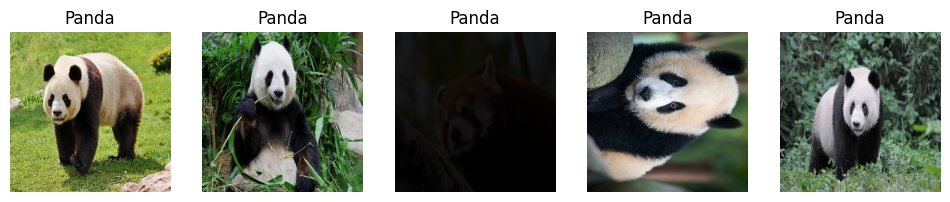

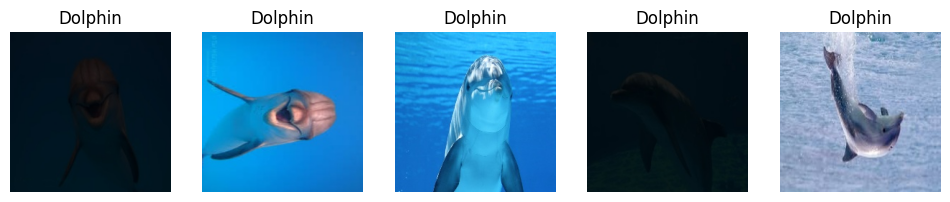

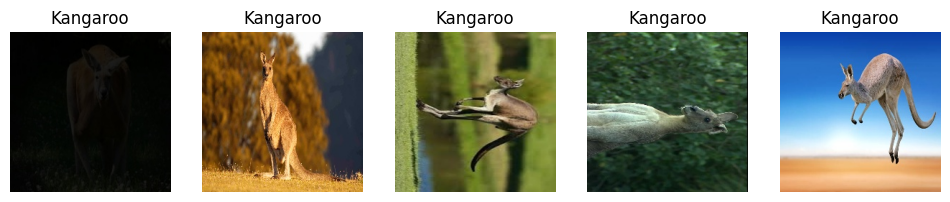

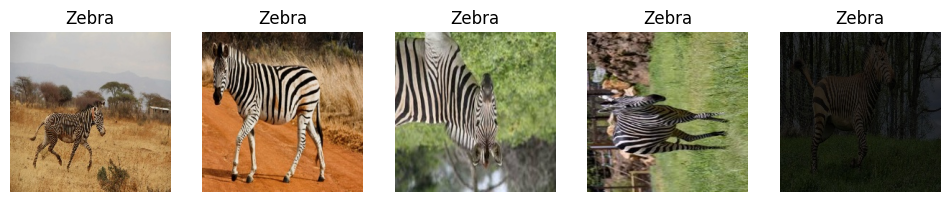

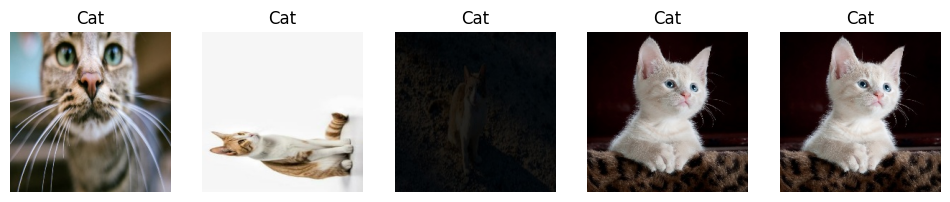

...

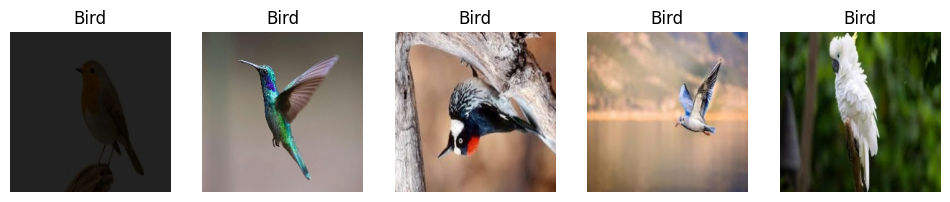

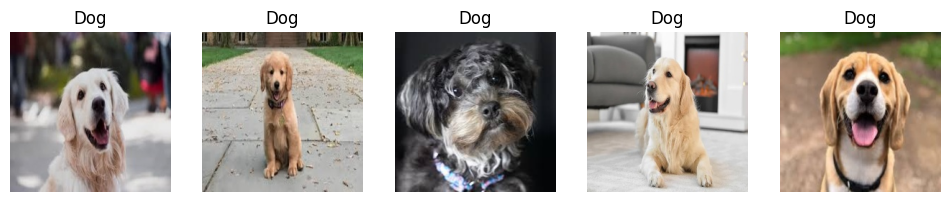

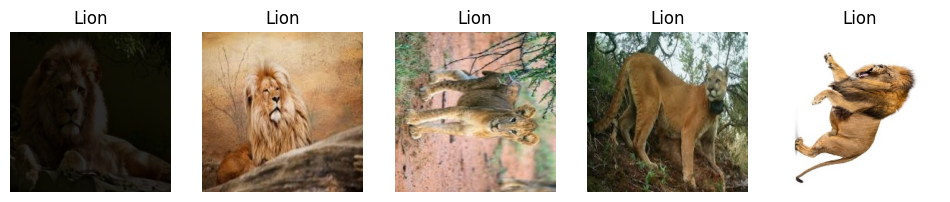

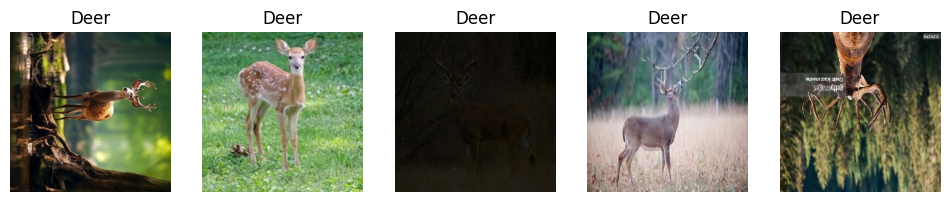

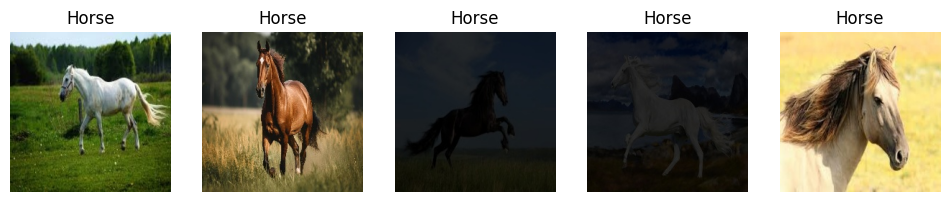

In [6]:
# Show some sample images from each class

import random
import matplotlib.pyplot as plt

def display_sample_imgs(data_path, n_samples = 5):
  path = Path(data_path)

  for class_dir in path.iterdir():
    if class_dir.is_dir():
      images = (list(class_dir.glob('*.jpg')) + list(class_dir.glob('*.jpeg')))

      class_samples = random.sample(images, n_samples)

      fig, axes = plt.subplots(1, n_samples, figsize=(12, 4))
      for ax, img_path in zip(axes, class_samples):
            img = Image.open(img_path)
            ax.imshow(img)
            ax.axis('off')
            ax.set_title(class_dir.name)
      plt.show()

display_sample_imgs(DATA_PATH)

### Data Inspection Notes
- Some images are almost completely black, need to be removed.
- Some images are rotated 90°, 180°, or 270°, can be handled later by fast ai augmentations.
- Slight brightness variations are present, can also be handled by fast ai augmentations.

In [7]:
# Remove almost black images from Dataset, we will use a threshold to decide if image is black enough to be removed

import numpy as np

def remove_black_imgs(image_paths, threshold = 10):
  num_deleted_imgs = 0

  for img_path in image_paths:
    try:
      img = Image.open(img_path).convert('L')  # convert to grey scale
      arr = np.array(img)

      if arr.mean() < threshold:
        img_path.unlink()
        num_deleted_imgs += 1

    except Exception as e:
      print(f'Error: {e}')
      img_path.unlink()
      num_deleted_imgs

  return num_deleted_imgs

num_deleted = remove_black_imgs(all_images)
print(f'Deleted {num_deleted} images')

Deleted 41 images


In [8]:
# Show Final Dataset Structure

class_info, all_images = get_class_info(DATA_PATH)

df = pd.DataFrame(class_info)

analyze_dataset(df)

Dataset Summary: 

Total Classes: 15
Total Images: 1903
Average per class: 126.9
Min: 117, Max: 137
STD: 5.475486497193868
DataFrame: 

       class  count
0      Panda    129
1    Dolphin    128
2   Kangaroo    122
3      Zebra    137
4        Cat    121
5       Bear    121
6   Elephant    131
7      Tiger    125
8    Giraffe    127
9        Cow    131
10      Bird    134
11       Dog    117
12      Lion    131
13      Deer    123
14     Horse    126


## Data Loading In Fast AI

In [9]:
# installing fast ai
!pip install fastai --upgrade

In [20]:
from fastai.vision.all import *

path = Path(DATA_PATH)

# Create DataLoaders, make sure to handle flips, brightness/contrast, zoom
dls = ImageDataLoaders.from_folder(
    path,
    valid_pct=0.2,
    seed=42,
    item_tfms=Resize(224),      # resize all images to 224x224
    batch_tfms=aug_transforms(
        do_flip=True,           # learns horizontal flips
        flip_vert=True,         # learns vertical flips
        max_rotate=180,         # handles upside-down or sideways images
        max_lighting=0.2,       # adjusts brightness and contrast randomly
        max_zoom=1.1            # optional slight zoom
    )
)

# Display DataLoaders information
print("DataLoaders Summary:\n")
print(f"Training images: {len(dls.train_ds)}")
print(f"Validation images: {len(dls.valid_ds)}")
print(f"Number of classes: {len(dls.vocab)}")
print(f"\nClasses: {dls.vocab}")

DataLoaders Summary:

Training images: 1523
Validation images: 380
Number of classes: 15

Classes: ['Bear', 'Bird', 'Cat', 'Cow', 'Deer', 'Dog', 'Dolphin', 'Elephant', 'Giraffe', 'Horse', 'Kangaroo', 'Lion', 'Panda', 'Tiger', 'Zebra']


Sample Batch from Training Set:


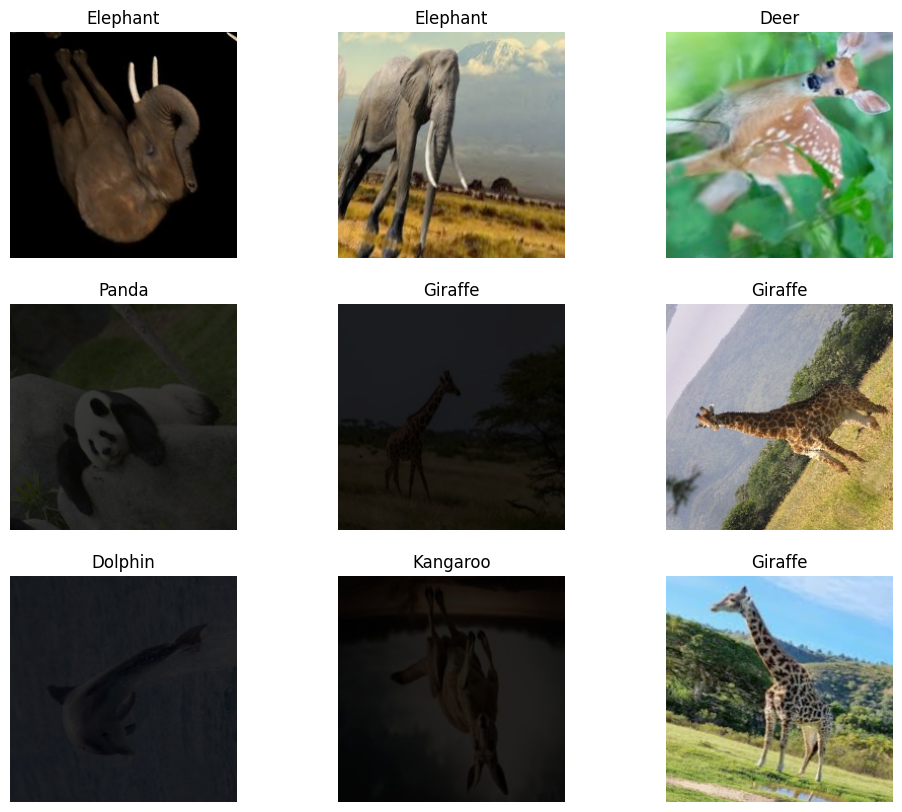

In [21]:
print("Sample Batch from Training Set:")
dls.show_batch(max_n=9, figsize=(12, 10))

Data Augmentation Examples (same image, different augmentations):


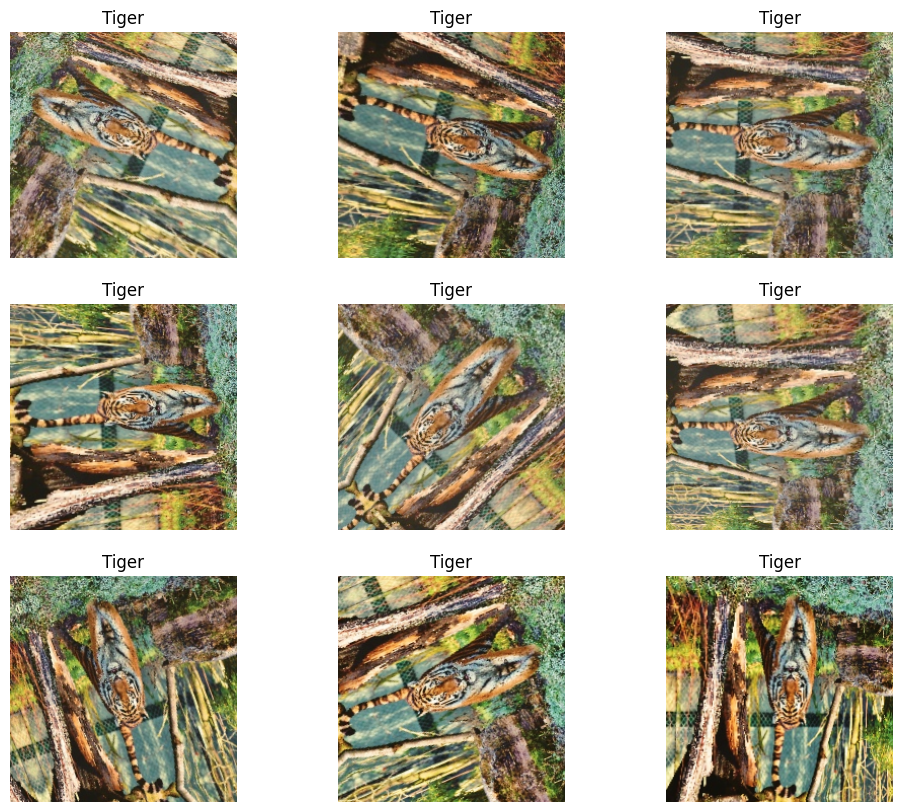

In [22]:
print("Data Augmentation Examples (same image, different augmentations):")
dls.train.show_batch(max_n=9, figsize=(12, 10), unique=True)

## Model Training

In [23]:
# Create the learner with pretrained ResNet34
learn = vision_learner(
    dls,
    resnet34,  # Pretrained architecture
    metrics=[error_rate, accuracy]  # Track these metrics during training
)

print("Transfer learning model created")
print(f"Architecture: ResNet34 (pretrained on ImageNet)")
print(f"Output classes: {len(dls.vocab)}")
print(f"Metrics: error_rate, accuracy")

Transfer learning model created
Architecture: ResNet34 (pretrained on ImageNet)
Output classes: 15
Metrics: error_rate, accuracy


In [29]:
EPOCHS = 5

learn.freeze()

# Finding optimal learning rate
suggested_lr = learn.lr_find(show_plot=False)

# Fine tune
learn.fine_tune(EPOCHS, base_lr=suggested_lr.valley)

print("\nFine-tuning complete")

epoch,train_loss,valid_loss,error_rate,accuracy,time
0,0.118329,0.025736,0.007895,0.992105,00:04


epoch,train_loss,valid_loss,error_rate,accuracy,time
0,0.080324,0.029900,0.010526,0.989474,00:05
1,0.081469,0.036999,0.013158,0.986842,00:05
2,0.070977,0.024620,0.010526,0.989474,00:05
3,0.063792,0.013032,0.005263,0.994737,00:05
4,0.053944,0.012245,0.002632,0.997368,00:05



Fine-tuning complete


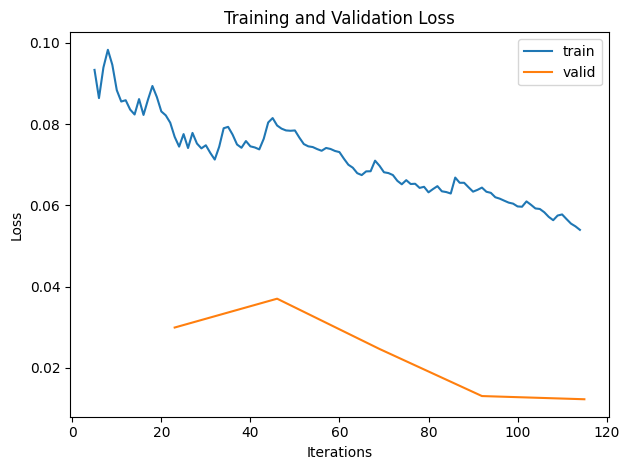

In [35]:
# Training Curves

# Plot the training history
learn.recorder.plot_loss()
plt.title('Training and Validation Loss')
plt.xlabel('Iterations')
plt.ylabel('Loss')
plt.tight_layout()
plt.show()

We can see that the model converges well

## Evaluation

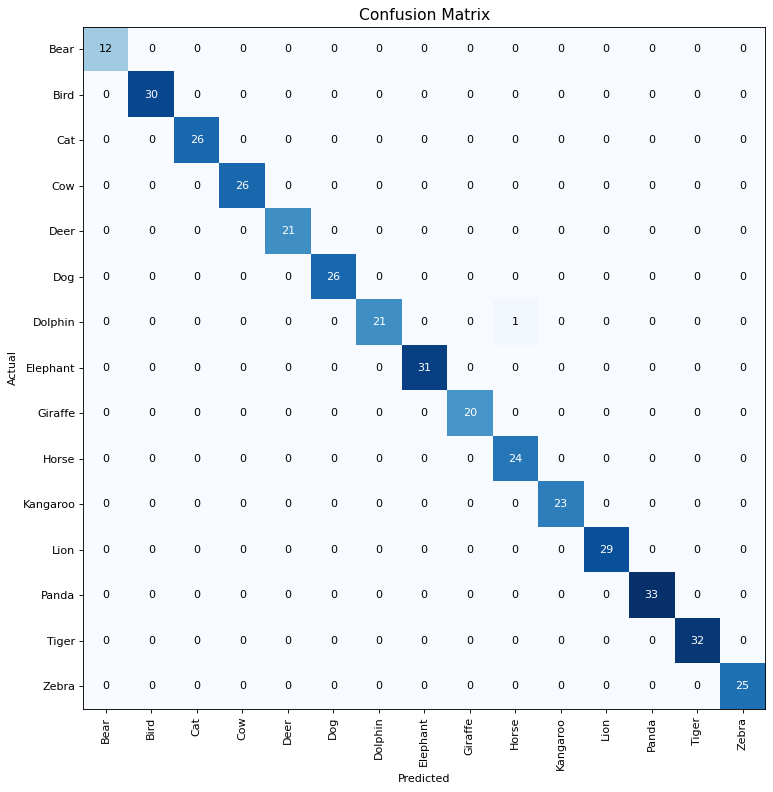

In [36]:
# Confusion Matrix

# Create interpretation object
interp = ClassificationInterpretation.from_learner(learn)

interp.plot_confusion_matrix(figsize=(12, 10), dpi=80)
plt.title('Confusion Matrix', fontsize=14)
plt.tight_layout()
plt.show()

We can see that there is no major confusion between classes

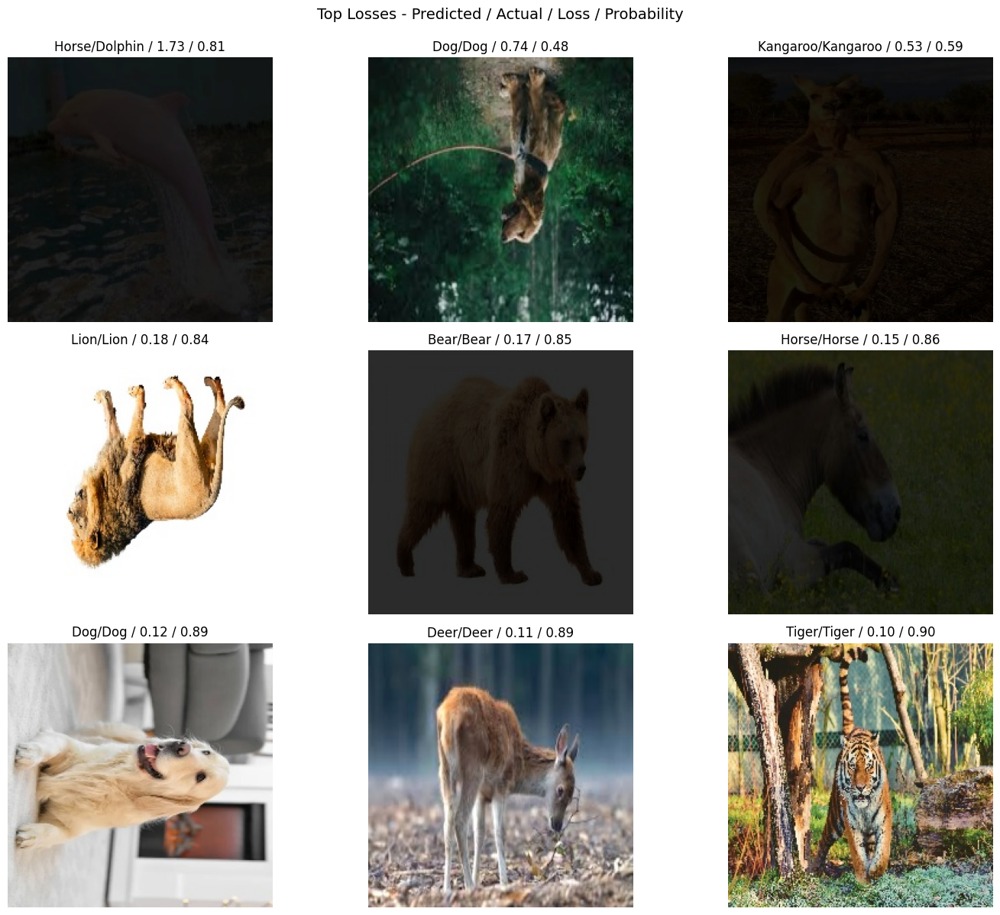

In [41]:
# Top Losses

interp.plot_top_losses(9, figsize=(15, 12))
plt.suptitle('Top Losses - Predicted / Actual / Loss / Probability', fontsize=14, y=0.995)
plt.tight_layout()
plt.show()

Most examples have low loss and high probability, meaning the model is confident and correct most of the time.

Correct Predictions:



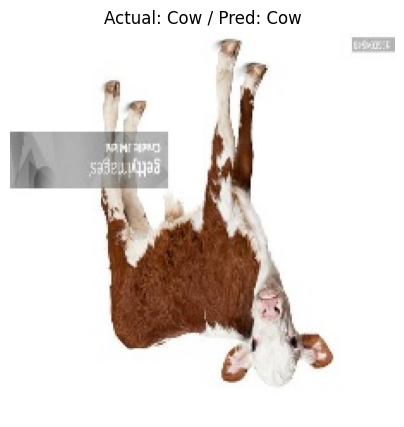

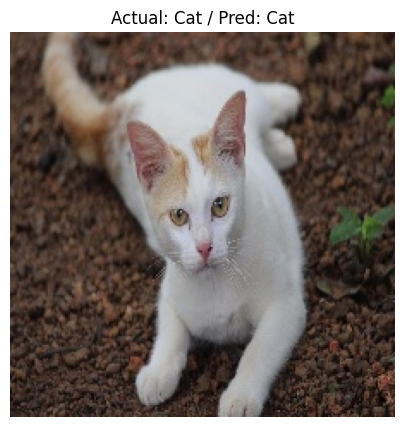

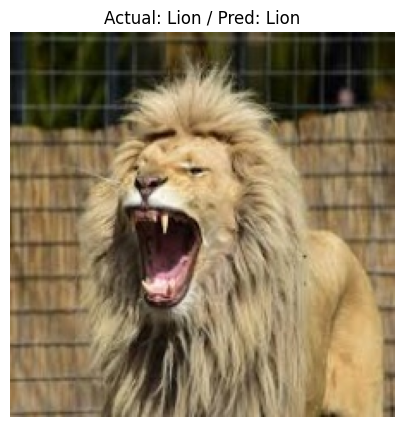

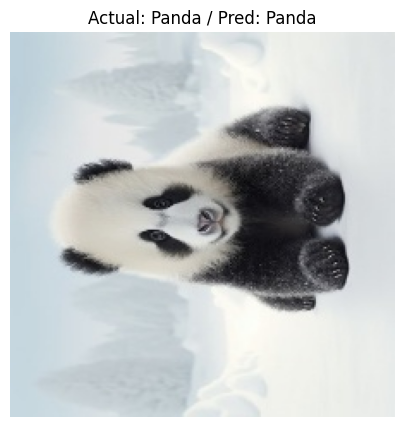

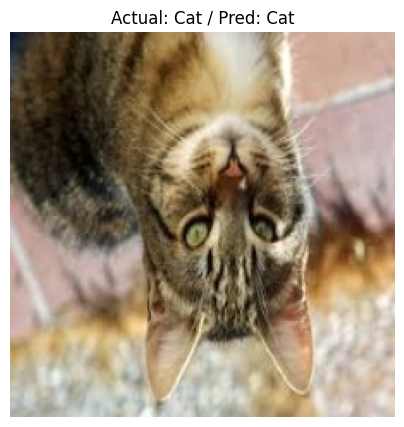

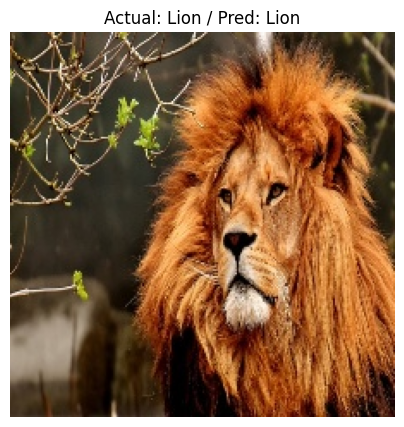

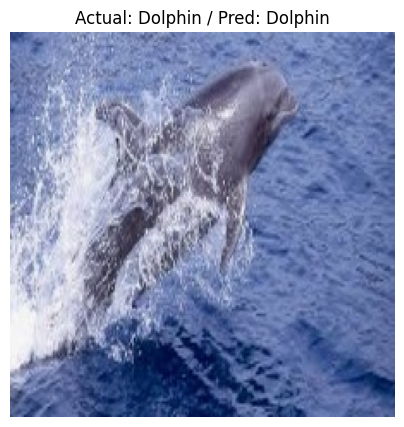

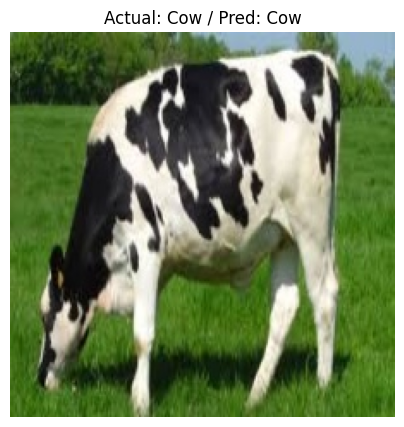

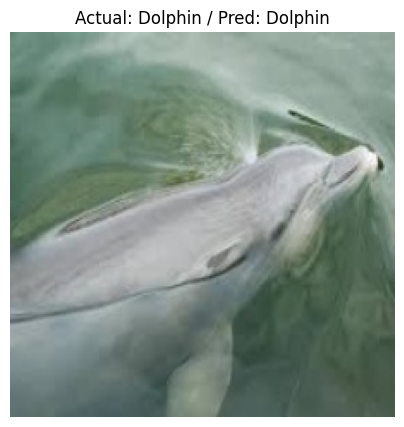

In [48]:
# Examples of correct predictions

from fastai.vision.utils import show_image

preds, targs = learn.get_preds()
correct_idxs = (preds.argmax(dim=1) == targs).nonzero().flatten()

print('Correct Predictions:\n')

for i in correct_idxs[:9]:
    img = dls.valid_ds[i][0]
    show_image(img, title=f"Actual: {dls.vocab[targs[i]]} / Pred: {dls.vocab[preds.argmax(dim=1)[i]]}")


Incorrect Predictions:



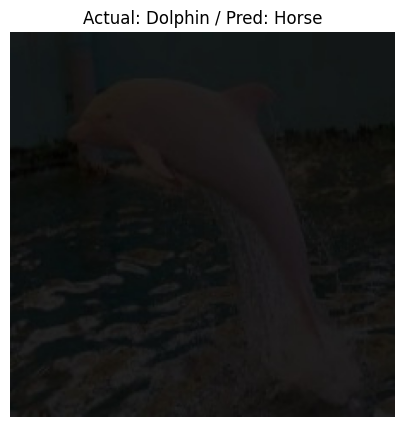

In [49]:
# Examples of incorrect predictions

incorrect_idxs = (preds.argmax(dim=1) != targs).nonzero().flatten()

print('Incorrect Predictions:\n')

for i in incorrect_idxs[:9]:
    img = dls.valid_ds[i][0]
    show_image(img, title=f"Actual: {dls.vocab[targs[i]]} / Pred: {dls.vocab[preds.argmax(dim=1)[i]]}")

## Model Weaknesses
The Model performs well, achieving almost perfect accuracy on the validation set.

It seemed to only misclassify one image.
The minor error could be due to the image low brightness.